In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml

import rmm
import cupy as cp
from rmm.allocators.cupy import rmm_cupy_allocator

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Memory Management

In [2]:
# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

# Load the data

In [3]:
dpath = "/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/"

file_list = glob.glob(f"{dpath}hsc_a*/*.h5ad")
file_list

['/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_aux/lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/hsc_and_progenitors.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/fibroblasts.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/mesenchymal_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/myeloid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/innate_lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/endothelial_cells.h5ad']

In [4]:
def load_first_n_cells(file: str, n: int) -> an.AnnData:
    with h5py.File(file, 'r') as f:
        if isinstance(f['X'], h5py.Group):  # likely sparse
            data = f['X/data'][:]
            indices = f['X/indices'][:]
            indptr = f['X/indptr'][:n+1]  # one extra for CSR row pointer
            shape = (n, f['X'].attrs['shape'][1])

            data = data[:indptr[-1]]  # only use data for first n rows
            indices = indices[:indptr[-1]]

            X_slice = sp.csr_matrix((data, indices, indptr), shape=shape)
        else:
            X_slice = f['X'][:n]

    backed = an.read_h5ad(file, backed='r')
    obs = backed.obs.iloc[:n].copy()
    var = backed.var.copy()
    backed.file.close()

    return an.AnnData(X=X_slice, obs=obs, var=var)

In [5]:
sample_size = 200000
adata_list = []

for fpath in file_list:
    basename = os.path.basename(fpath).replace(".h5ad", "")
    print(f"Working {basename}...")
    adata = sc.read_h5ad(fpath)
    # adata = read_top_n_anndata(fpath, sample_size)
    print(f"\t {len(adata)} Cells")
    adata.obs['basename'] = basename
    adata.var_names = adata.var['feature_name']

    if not sample_size is None:
        if sample_size >= len(adata):
            print(f"\tTaking all cells")
        else:
            print(f"\tSampled {sample_size} ({(sample_size / len(adata)) * 100:.2f}%)")
            adata = sc.pp.sample(adata, n=sample_size, copy=True)
    
    adata_list.append(adata)
    # break

adata = an.concat(adata_list)
adata.obs['dataset_id_int'] = adata.obs['dataset_id'].astype('category').cat.codes
adata.obs['basename'].value_counts()
print()
adata

Working lymphoid_cells...
	 3761959 Cells
	Sampled 200000 (5.32%)
Working hsc_and_progenitors...
	 66394 Cells
	Taking all cells
Working fibroblasts...
	 1277902 Cells
	Sampled 200000 (15.65%)
Working mesenchymal_cells...
	 650601 Cells
	Sampled 200000 (30.74%)
Working myeloid_cells...
	 1147059 Cells
	Sampled 200000 (17.44%)
Working innate_lymphoid_cells...
	 15277 Cells
	Taking all cells
Working endothelial_cells...
	 1043398 Cells
	Sampled 200000 (19.17%)



/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081671 × 60530
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int'

# Basic filtering and processing

In [6]:
rsc.get.anndata_to_GPU(adata)
rsc.pp.filter_cells(adata, min_counts=200)
rsc.pp.filter_genes(adata, min_counts=50)

adata.layers['raw'] = adata.X.get()

rsc.pp.normalize_total(adata, target_sum=1e4)
rsc.pp.log1p(adata)

rsc.get.anndata_to_GPU(adata) # move to GPU
adata

filtered out 186 cells that have less than 200 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


filtered out 17107 genes that are detected in less than 50 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081485 × 43423
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'raw'

# Cell type simplification

In [7]:
# Load YAML into a dictionary
with open("../resources/cell_map.yaml", "r") as file:
    cell_map = yaml.safe_load(file)

adata.obs['cell_type_simplified'] = adata.obs['cell_type'].map(cell_map)

# drop nan - unmappable
adata = adata[adata.obs['cell_type_simplified'].notna(), :].copy()

adata.obs['cell_type_simplified'].value_counts(dropna=False)

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


cell_type_simplified
Fibroblast                 199997
Endothelial Cell           199992
Mesenchymal Other          179087
T Cell CD4+                 80097
Progenitor Cell             74599
Monocyte                    60732
Macrophage                  56222
T Cell CD8+                 39774
Erythrocyte                 31718
Smooth Muscle Cell          20908
Dendritic Cell              19241
ILC                         15277
B Cell Naive                15067
NK Cell                     13852
Thymocyte                   12747
T Cell Other                12483
B Cell Memory                9398
Neutrophil                   8433
B Cell Other/Developing      7988
Mast Cell                    7548
Megakaryocyte/Platelet       7480
B Cell Plasma                7344
Lymphocyte                    867
T Cell Regulatory             353
Eosinophil/Basophil           278
Name: count, dtype: int64

In [8]:
# drop nan
adata = adata[adata.obs['cell_type_simplified'].notna(), :].copy()
adata

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081482 × 43423
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'raw'

# Feature Engineering

Number of genes before HVG selection: 43423


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/rapids_singlecell/preprocessing/_hvg.py:542: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Number of genes after HVG selection: 5000


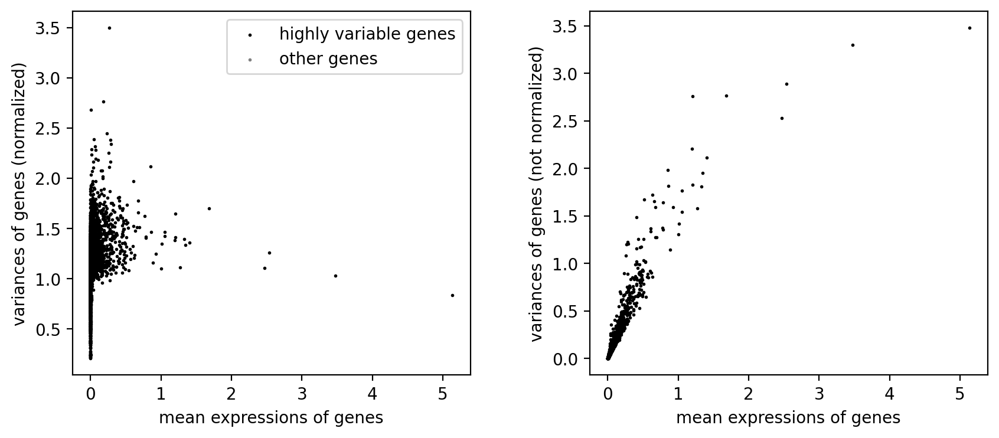

AnnData object with n_obs × n_vars = 1081482 × 5000
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'raw'

In [9]:
adata.raw = adata  # keep full dimension safe
print(f"Number of genes before HVG selection: {adata.n_vars}")

rsc.pp.highly_variable_genes(
    adata, 
    # n_top_genes=5000, 
    flavor="seurat_v3", 
    # batch_key="basename",
)

adata = adata[:, adata.var['highly_variable']].copy()

print(f"Number of genes after HVG selection: {adata.n_vars}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 4
sc.pl.highly_variable_genes(
    adata
)

adata

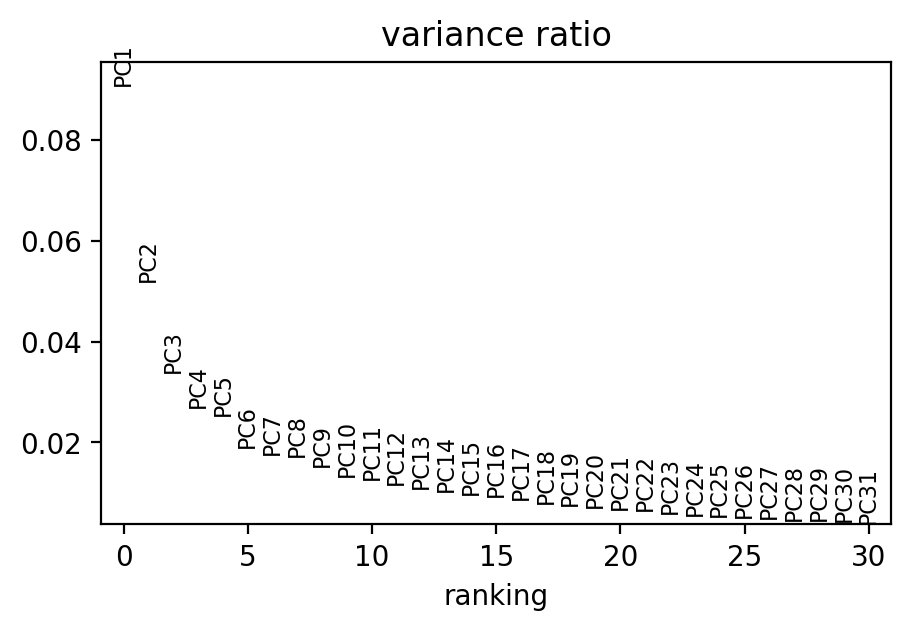

AnnData object with n_obs × n_vars = 1081482 × 5000
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw'

In [10]:
rsc.pp.pca(
    adata,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3
sc.pl.pca_variance_ratio(
    adata
)

adata

# Embedding

[2025-04-03 13:26:04.584] [CUML] [debug] n_neighbors=15
[2025-04-03 13:26:04.584] [CUML] [debug] Calling knn graph run
[2025-04-03 13:26:04.584] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-03 13:26:04.845] [CUML] [debug] Done. Calling remove zeros


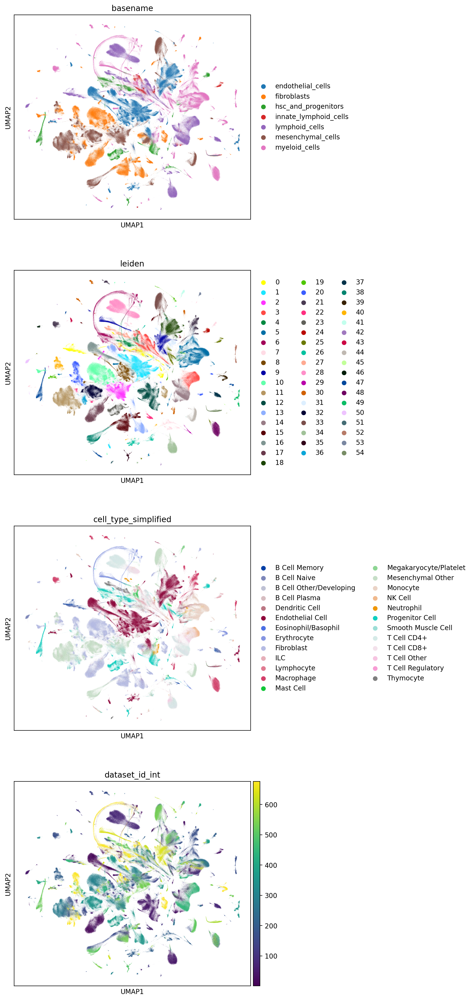

In [11]:
rsc.pp.neighbors(
    adata,
)

rsc.tl.umap(
    adata,
)

rsc.tl.leiden(
    adata,
    resolution=0.35,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sc.pl.umap(
    adata,
    ncols=1,
    color=['basename', 'leiden', 'cell_type_simplified', 'dataset_id_int']
)


# scVI

In [12]:
adata

AnnData object with n_obs × n_vars = 1081482 × 5000
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified', 'leiden'
    var: 'n_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'basename_colors', 'leiden_colors', 'cell_type_simplified_colors'
    obsm: 'X_pca', 'X_uma

In [13]:
scvi.model.SCVI.setup_anndata(
    adata, 
    layer="raw",
    batch_key="dataset_id",
    labels_key='cell_type_simplified',
)

model = scvi.model.SCVI(
    adata,
    n_layers=2,
    n_latent=24,
    gene_likelihood="nb",
)

model.train(
    max_epochs=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=2,
    early_stopping_monitor='validation_loss',
)

adata.obsm["X_scVI"] = model.get_latent_representation()

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 119 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Light

Epoch 19/100:  19%|█▉        | 19/100 [04:03<17:18, 12.82s/it, v_num=1, train_loss_step=304, train_loss_epoch=317]
Monitored metric validation_loss did not improve in the last 2 records. Best score: 316.999. Signaling Trainer to stop.


[2025-04-03 13:32:09.993] [CUML] [debug] n_neighbors=150
[2025-04-03 13:32:09.993] [CUML] [debug] Calling knn graph run
[2025-04-03 13:32:09.993] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-03 13:32:11.829] [CUML] [debug] Done. Calling remove zeros


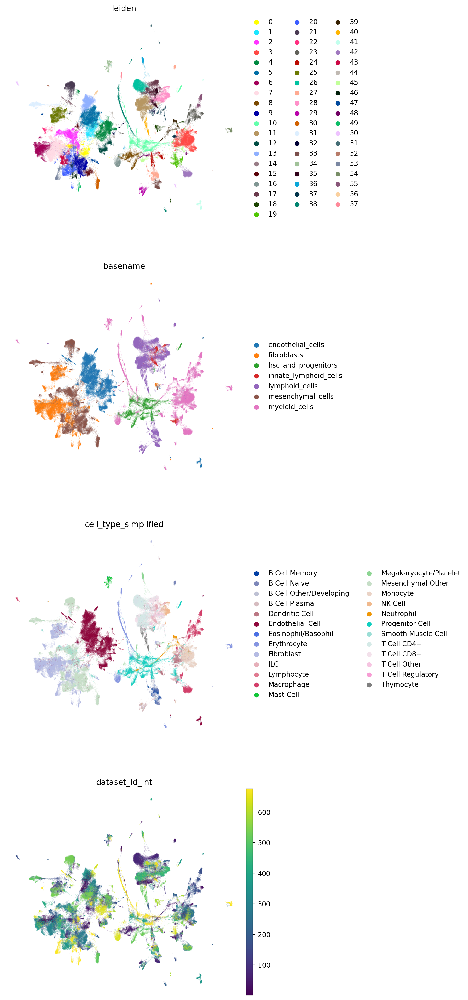

In [14]:
rsc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

sc.pl.umap(
    adata,
    color=["leiden", "basename", "cell_type_simplified", "dataset_id_int"],
    frameon=False,
    ncols=1,
)

# scANVI

In [15]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="cell_type_simplified",
    unlabeled_category="Unknown",
)

scanvi_model.train(
    max_epochs=20, 
    n_samples_per_label=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=2,
    early_stopping_monitor='validation_loss',
)

adata.obsm['X_scANVI'] = scanvi_model.get_latent_representation(adata)

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 119 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


INFO     Training for 20 epochs.                                                                                   


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-9d3c60d0-1a19-5156-a4ab-627906ae098b]

  | Name            | Type                | Params | Mode 
-------

Epoch 3/20:  15%|█▌        | 3/20 [01:28<08:20, 29.45s/it, v_num=1, train_loss_step=309, train_loss_epoch=312]
Monitored metric validation_loss did not improve in the last 2 records. Best score: 355.290. Signaling Trainer to stop.


[2025-04-03 13:37:45.040] [CUML] [debug] n_neighbors=150
[2025-04-03 13:37:45.040] [CUML] [debug] Calling knn graph run
[2025-04-03 13:37:45.040] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-03 13:37:46.940] [CUML] [debug] Done. Calling remove zeros


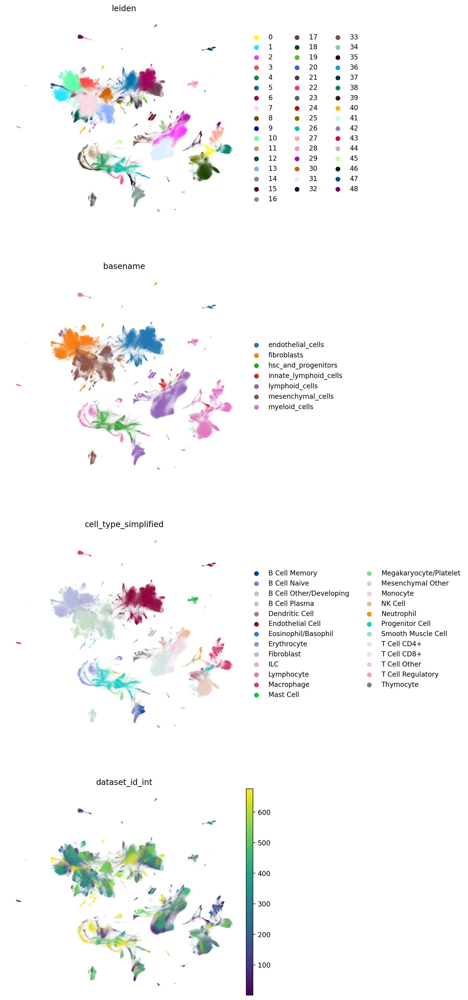

In [16]:
rsc.pp.neighbors(adata, use_rep='X_scANVI', n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

sc.pl.umap(
    adata,
    color=["leiden", "basename", "cell_type_simplified", "dataset_id_int"],
    frameon=False,
    ncols=1,
)

In [17]:
adata.var.head()

,n_counts,n_cells,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
feature_name,,,,,,,,
WNT16,7010.0,2822,True,1764.0,0.002779,0.003538,0.945884,1
SLC4A1,207560.0,28808,True,327.0,0.054270,0.142021,1.528513,3
CALCR,4853.0,2992,True,1040.0,0.004358,0.009194,1.221813,3
ACSM3,205109.0,58196,True,1637.5,0.077633,0.163679,1.383850,4
MPO,1003708.0,22979,True,603.5,0.044540,0.140960,1.623159,4


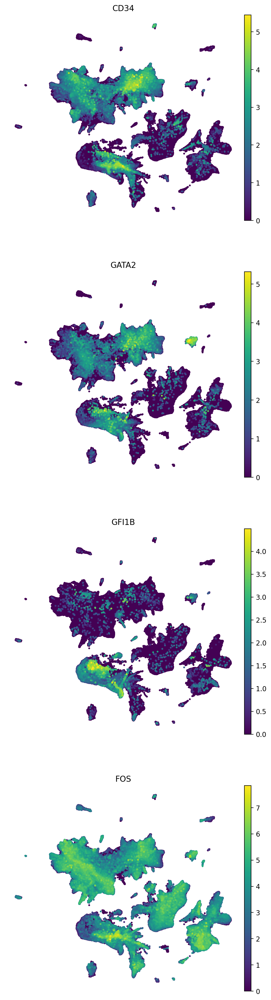

In [18]:
sc.pl.umap(
    adata,
    color=['CD34', 'GATA2', 'GFI1B', 'FOS'],
    frameon=False,
    size=30,
    ncols=1,
)

# differential gene expression

In [19]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [22]:
# deg = scanvi_model.differential_expression(
#     adata,
#     groupby='cell_type_simplified',
#     batch_correction=True,
#     filter_outlier_cells=True,
# )

# deg = deg.reset_index()

DE...:   0%|          | 0/25 [07:32<?, ?it/s]



KeyboardInterrupt



In [ ]:
# rsc.tl.rank_genes_groups_logreg(
#     adata,
#     groupby='basename',
# )


# df = sc.get.rank_genes_groups_df(
#     adata,
#     group=None,
# )

# df.head()


In [ ]:
rsc.__version__